Task A

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

def initial_condition(x, kind="sin2"):
    if kind == "sin2":
        return np.sin(2.0 * np.pi * x)
    if kind == "sin5":
        return np.sin(5.0 * np.pi * x)
    if kind == "chopped":
        y = np.zeros_like(x)
        mask = (x > 1.0/5.0) & (x < 2.0/5.0)
        y[mask] = np.sin(5.0 * np.pi * x[mask])
        return y
    raise ValueError("Unknown kind")

def solve_wave_1d(L=1.0, c=1.0, N=400, dt=1e-3, T=1.0, ic_kind="sin2"):
    """Solve the 1D wave equation on [0, L] with fixed ends using an explicit FD scheme.

    Uses zero initial velocity (psi_t(x,0)=0) and Dirichlet boundaries psi(0,t)=psi(L,t)=0.
    Returns the grid x, snapshot times, and a list of saved solution arrays.
    """
    dx = L / N
    r = c * dt / dx
    if r > 1.0:
        raise ValueError(f"Unstable: c*dt/dx = {r:.3f} > 1.")

    x = np.linspace(0.0, L, N + 1)

    # Psi^0
    psi = initial_condition(x, kind=ic_kind)
    psi[0] = 0.0
    psi[-1] = 0.0

    # First step Psi^1 using Taylor start with Psi_t(x,0)=0
    lap0 = (psi[2:] - 2.0 * psi[1:-1] + psi[:-2]) / (dx * dx)
    psi_next = psi.copy()
    psi_next[1:-1] = psi[1:-1] + 0.5 * (c * dt)**2 * lap0
    psi_next[0] = 0.0
    psi_next[-1] = 0.0

    psi_prev = psi
    psi = psi_next

    n_steps = int(np.round(T / dt))

    save_every = max(1, n_steps // 400)
    snapshots = [psi_prev.copy(), psi.copy()]
    times = [0.0, dt]

    for n in range(1, n_steps):
        # Interior update
        lap = (psi[2:] - 2.0 * psi[1:-1] + psi[:-2]) / (dx * dx)
        psi_new = np.empty_like(psi)
        psi_new[1:-1] = 2.0 * psi[1:-1] - psi_prev[1:-1] + (c * dt)**2 * lap

        # Fixed boundaries
        psi_new[0] = 0.0
        psi_new[-1] = 0.0

        psi_prev, psi = psi, psi_new

        if (n + 1) % save_every == 0:
            snapshots.append(psi.copy())
            times.append((n + 1) * dt)

    return x, np.array(times), snapshots

Task B

In [ ]:
from IPython.display import HTML


def ic_label(ic_kind):
    if ic_kind == "sin2":
        return r"$\Psi(x,0)=\sin(2\pi x)$"
    if ic_kind == "sin5":
        return r"$\Psi(x,0)=\sin(5\pi x)$"
    if ic_kind == "chopped":
        return r"$\Psi(x,0)=\sin(5\pi x)$ for $x\in(1/5,2/5)$, else $0$"
    return rf"$\Psi(x,0)$ = {ic_kind}"

def plot_overlays(x, times, snapshots, pick_times, ic_kind, L, c, N, dt):
    plt.figure()
    for t in pick_times:
        idx = int(np.argmin(np.abs(times - t)))
        plt.plot(x, snapshots[idx], label=fr"$t \approx {times[idx]:.3f}\,\mathrm{{s}}$")

    plt.xlabel(r"$x$")        
    plt.ylabel(r"$\Psi(x,t)$")

    plt.title(rf"1D wave equation snapshots" "\n" rf"{ic_label(ic_kind)} (L={L}, c={c}, N={N}, dt={dt})")

    plt.legend()
    plt.tight_layout()
    plt.show()


Task C

In [ ]:
def animate_solution(x, times, snapshots, ic_kind, L, c, N, dt, interval_ms=30):
    fig, ax = plt.subplots()
    line, = ax.plot(x, snapshots[0])
    ax.set_xlim(x[0], x[-1])

    all_min = min(s.min() for s in snapshots)
    all_max = max(s.max() for s in snapshots)
    pad = 0.1 * (all_max - all_min + 1e-12)
    ax.set_ylim(all_min - pad, all_max + pad)

    ax.set_xlabel(r"$x$")
    ax.set_ylabel(r"$\Psi(x,t)$")

    base_title = rf"1D wave equation, {ic_label(ic_kind)} (L={L}, c={c}, N={N}, dt={dt})"
    title = ax.set_title(f"{base_title}\n" + fr"$t = {times[0]:.3f}\,\mathrm{{s}}$")

    def update(frame):
        line.set_ydata(snapshots[frame])
        title.set_text(f"{base_title}\n" + fr"$t = {times[frame]:.3f}\,\mathrm{{s}}$")
        return line, title

    anim = FuncAnimation(fig, update, frames=len(snapshots), interval=interval_ms, blit=False)
    plt.tight_layout()
    plt.show()
    return anim

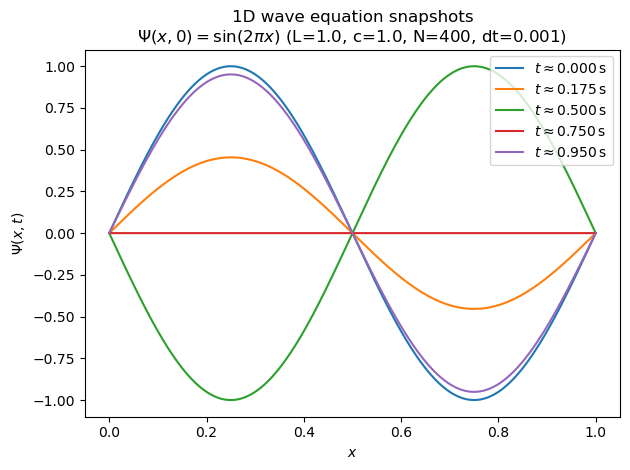

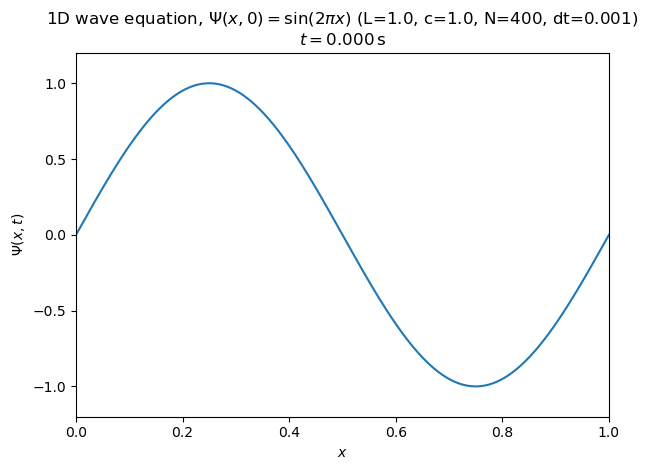

In [14]:
L = 1.0
c = 1.0
dt = 1e-3
T = 2.0
N = 400

# Choose initial condition: "sin2" or "sin5" or "chopped"
ic_kind = "sin2"

x, times, snapshots = solve_wave_1d(L=L, c=c, N=N, dt=dt, T=T, ic_kind=ic_kind)

plot_overlays(x, times, snapshots, pick_times=[0.0, 0.175, 0.5, 0.75, 0.95],
            ic_kind=ic_kind, L=L, c=c, N=N, dt=dt)

anim = animate_solution(x, times, snapshots, ic_kind=ic_kind, L=L, c=c, N=N, dt=dt, interval_ms=5)
HTML(anim.to_jshtml())
